In [102]:
#Basic and most imp libraries
import pandas as pd , numpy as np
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from collections import Counter
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
pd.set_option("display.max_row",None)
pd.set_option("display.max_columns",None)
import plotly.express as px
import plotly.figure_factory as ff
import plotly

#Classifiers
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier, RandomForestClassifier
from sklearn.linear_model import RidgeClassifier, LinearRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, RandomForestRegressor, GradientBoostingRegressor

from sklearn.svm import SVR
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from xgboost import plot_importance
from xgboost import XGBClassifier
from sklearn.svm import SVR

#Model evaluation tools
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

import warnings 
warnings.filterwarnings("ignore")

In [103]:
df=pd.read_csv("TaxiFare.csv")


In [104]:
sns.set_theme(palette='tab10',
             font='sans-serif',
             font_scale=1.0,
             )
import matplotlib
matplotlib.rcParams.update({'font.size':10})
plt.style.use('dark_background')

In [105]:
df.head().style.background_gradient(cmap='rainbow')

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,26:21.0,4.500000,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,52:16.0,16.900000,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,35:00.0,5.700000,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,30:42.0,7.700000,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,51:00.0,5.300000,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


### Data Cleaning

In [106]:
df.isnull().sum()

unique_id               0
amount                  0
date_time_of_pickup     0
longitude_of_pickup     0
latitude_of_pickup      0
longitude_of_dropoff    0
latitude_of_dropoff     0
no_of_passenger         0
dtype: int64

In [107]:
df=df.drop(["unique_id"],axis=1)

In [108]:
df.dtypes

amount                  float64
date_time_of_pickup      object
longitude_of_pickup     float64
latitude_of_pickup      float64
longitude_of_dropoff    float64
latitude_of_dropoff     float64
no_of_passenger           int64
dtype: object

In [109]:
df.describe().style.background_gradient(cmap='rainbow')

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,11.364171,-72.509756,39.933759,-72.504616,39.926251,1.667840
std,9.685557,10.393860,6.224857,10.407570,6.014737,1.289195
min,-5.000000,-75.423848,-74.006893,-84.654241,-74.006377,0.000000
25%,6.000000,-73.992062,40.734880,-73.991152,40.734372,1.000000
50%,8.500000,-73.981840,40.752678,-73.980082,40.753372,1.000000
75%,12.500000,-73.967148,40.767360,-73.963584,40.768167,2.000000
max,200.000000,40.783472,401.083332,40.851027,43.415190,6.000000


In [110]:
df['amount'] = pd.to_numeric(df['amount'], errors='coerce')
df['date_time_of_pickup'] = pd.to_datetime(df['date_time_of_pickup'], format='%Y-%m-%d %H:%M:%S UTC')

In [111]:
df.dtypes

amount                         float64
date_time_of_pickup     datetime64[ns]
longitude_of_pickup            float64
latitude_of_pickup             float64
longitude_of_dropoff           float64
latitude_of_dropoff            float64
no_of_passenger                  int64
dtype: object

In [112]:
df['Hour'] = df['date_time_of_pickup'].dt.hour
df['minute'] =df['date_time_of_pickup'].dt.minute
df['date'] = df['date_time_of_pickup'].dt.day
df['day'] = df['date_time_of_pickup'].dt.dayofweek
df['month'] = df['date_time_of_pickup'].dt.month
df['year'] = df['date_time_of_pickup'].dt.year

In [113]:
df.drop('date_time_of_pickup', axis=1, inplace=True)

In [114]:
df.head().style.background_gradient(cmap='rainbow')

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,Hour,minute,date,day,month,year
0,4.500000,-73.844311,40.721319,-73.841610,40.712278,1,17,26,15,0,6,2009
1,16.900000,-74.016048,40.711303,-73.979268,40.782004,1,16,52,5,1,1,2010
2,5.700000,-73.982738,40.761270,-73.991242,40.750562,2,0,35,18,3,8,2011
3,7.700000,-73.987130,40.733143,-73.991567,40.758092,1,4,30,21,5,4,2012
4,5.300000,-73.968095,40.768008,-73.956655,40.783762,1,7,51,9,1,3,2010


In [115]:
df.shape

(50000, 12)

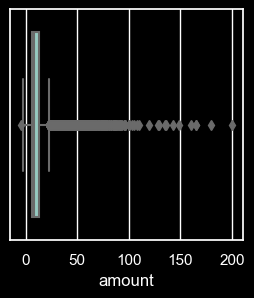

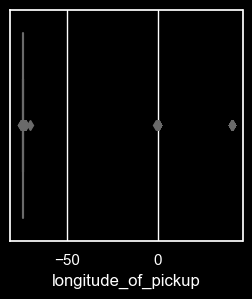

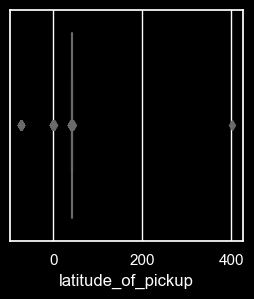

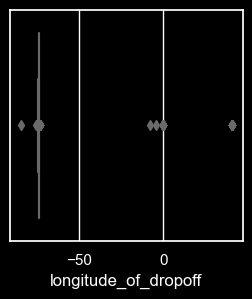

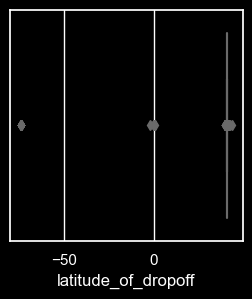

...

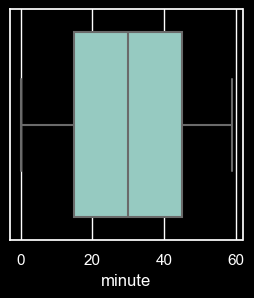

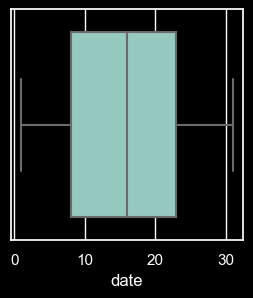

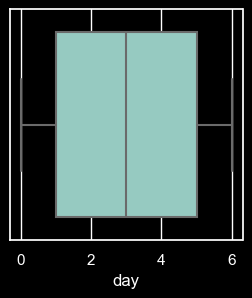

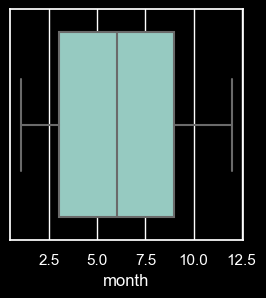

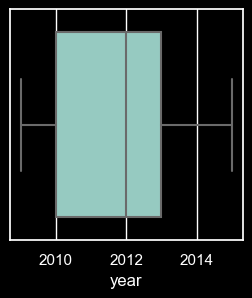

In [116]:
 df1=df.select_dtypes(exclude='object')
for column in df1:
    plt.figure(figsize=(3,3))
    sns.boxplot(x=column,data=df1)

In [117]:
def remove_outliers(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range

In [118]:
lowAge,uppAge=remove_outliers(df["amount"])
df["amount"]=np.where(df['amount']>uppAge,uppAge,df['amount'])
df["amount"]=np.where(df['amount']<lowAge,lowAge,df['amount'])

In [119]:
lowAge,uppAge=remove_outliers(df["no_of_passenger"])
df["no_of_passenger"]=np.where(df['no_of_passenger']>uppAge,uppAge,df['no_of_passenger'])
df["no_of_passenger"]=np.where(df['no_of_passenger']<lowAge,lowAge,df['no_of_passenger'])

Remove no. of passeneger less than 0 and grater than 6

In [120]:
df.drop(df[df['no_of_passenger'] > 6 ].index, inplace = True)
df.drop(df[df['no_of_passenger'] < 0 ].index, inplace = True)

In [121]:
df['amount'].sort_values(ascending=True).head(10)


42337   -3.75
13032   -3.00
2039    -2.90
36722   -2.50
2486    -2.50
28839   -2.50
47302    0.00
10002    0.00
27891    0.00
2780     0.01
Name: amount, dtype: float64

Remove amount less or equal to zero

In [122]:
df.drop(df[df['amount'] <= 0 ].index, inplace = True)

In [123]:
df.shape

(49991, 12)

Pickup and dropoff latitude should be (-90 to 90 )

In [124]:
df.drop(df[df['latitude_of_pickup'] > 90].index, inplace=True)
df.drop(df[df['latitude_of_pickup'] < -90].index, inplace=True)
df.drop(df[df['latitude_of_dropoff'] > 90].index, inplace=True)
df.drop(df[df['latitude_of_dropoff'] < -90].index, inplace=True) 

Pickup and dropoff longtitude should be ( -180 to 180 )

In [125]:
df.drop(df[df['longitude_of_pickup'] > 180].index, inplace=True)
df.drop(df[df['longitude_of_pickup'] < -180].index, inplace=True)
df.drop(df[df['longitude_of_dropoff'] > 180].index, inplace=True)
df.drop(df[df['longitude_of_dropoff'] < -180].index, inplace=True) 

In [126]:
df.shape

(49990, 12)

### Calculate distance using Haversion formulas

In [127]:
from math import *

def haversine(a):
    lon1=a[0]
    lat1=a[1]
    lon2=a[2]
    lat2=a[3]
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c =  2 * asin(sqrt(a))
    # Radius of earth in kilometers is 6371
    km = 6371* c
    return km

In [128]:
df['distance'] = df[['longitude_of_pickup','latitude_of_pickup','longitude_of_dropoff','latitude_of_dropoff']].apply(haversine,axis=1)

In [129]:
df.drop(['longitude_of_pickup','latitude_of_pickup','longitude_of_dropoff','latitude_of_dropoff'], axis=1, inplace=True)

In [130]:
df.head().style.background_gradient(cmap='rainbow')

,amount,no_of_passenger,Hour,minute,date,day,month,year,distance
0,4.500000,1.000000,17,26,15,0,6,2009,1.030764
1,16.900000,1.000000,16,52,5,1,1,2010,8.450134
2,5.700000,2.000000,0,35,18,3,8,2011,1.389525
3,7.700000,1.000000,4,30,21,5,4,2012,2.799270
4,5.300000,1.000000,7,51,9,1,3,2010,1.999157


In [131]:
df.describe().style.background_gradient(cmap='rainbow')

,amount,no_of_passenger,Hour,minute,date,day,month,year,distance
count,49990.000000,49990.000000,49990.000000,49990.000000,49990.000000,49990.000000,49990.000000,49990.000000,49990.000000
mean,10.109425,1.504691,13.488998,29.665573,15.671394,3.029946,6.273635,2011.739068,18.338892
std,5.462453,0.867922,6.507124,17.307190,8.660762,1.956897,3.461288,1.862528,353.499198
min,0.010000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2009.000000,0.000000
25%,6.000000,1.000000,9.000000,15.000000,8.000000,1.000000,3.000000,2010.000000,1.223530
50%,8.500000,1.000000,14.000000,30.000000,16.000000,3.000000,6.000000,2012.000000,2.120214
75%,12.500000,2.000000,19.000000,45.000000,23.000000,5.000000,9.000000,2013.000000,3.895748
max,22.250000,3.500000,23.000000,59.000000,31.000000,6.000000,12.000000,2015.000000,8667.818812


In [132]:
df['Hour'] = df['Hour'].astype('int64')
df['minute'] = df['minute'].astype('int64')
df['date'] = df['date'].astype('int64')
df['day'] = df['day'].astype('int64')
df['month'] = df['month'].astype('int64')
df['year'] = df['year'].astype('int64')

In [133]:
df.dtypes

amount             float64
no_of_passenger    float64
Hour                 int64
minute               int64
date                 int64
day                  int64
month                int64
year                 int64
distance           float64
dtype: object

In [134]:
df['distance'].sort_values(ascending=False).head(100)



48996    8667.818812
31823    8667.572331
9147     8667.542104
37798    8667.534293
8647     8667.497512
2397     8667.454421
472      8667.304968
46463    8667.134816
42606    8667.122726
21085    8667.103444
16690    8667.064257
22090    8667.047916
15919    8666.989922
28809    8666.989178
19775    8666.932754
45597    8666.878376
22183    8666.764871
11653    8666.701504
32916    8666.644740
18842    8666.628222
14308    8666.614377
13340    8666.613646
46082    8666.613332
10215    8666.584706
4597     8666.566030
40109    8666.526266
18388    8666.409077
31836    8666.323748
40673    8666.236334
32802    8666.090701
20508    8666.013549
10458    8665.976222
45845    8665.970302
35213    8665.905310
33053    8665.877845
34425    8665.877795
42347    8665.754977
10672    8665.702390
17159    8665.685354
46790    8665.639912
36493    8665.612139
34503    8665.605065
48058    8665.602469
44543    8665.596868
46908    8665.593351
37618    8665.572901
10488    8665.555634
30934    8665

Distance should be positive and less than 130 Km.


In [135]:
df.drop(df[df['distance'] >= 130].index, inplace=True)
df.drop(df[df['distance'] <= 0 ].index, inplace=True)

In [136]:
df.head().style.background_gradient(cmap='rainbow')

,amount,no_of_passenger,Hour,minute,date,day,month,year,distance
0,4.500000,1.000000,17,26,15,0,6,2009,1.030764
1,16.900000,1.000000,16,52,5,1,1,2010,8.450134
2,5.700000,2.000000,0,35,18,3,8,2011,1.389525
3,7.700000,1.000000,4,30,21,5,4,2012,2.799270
4,5.300000,1.000000,7,51,9,1,3,2010,1.999157


## Data Visualization

In [137]:
sns.set_theme(palette='tab10',
             font='sans-serif',
             font_scale=1.0,
             )
import matplotlib
matplotlib.rcParams.update({'font.size':10})
plt.style.use('dark_background')

In [138]:
df.sample(10).style.background_gradient(cmap='coolwarm')

,amount,no_of_passenger,Hour,minute,date,day,month,year,distance
21576,11.500000,1.000000,8,18,21,2,8,2013,3.024562
19347,21.500000,2.000000,22,4,2,1,7,2013,5.501515
30057,8.900000,2.000000,11,54,18,5,7,2009,2.922937
3990,5.300000,1.000000,8,43,23,2,5,2012,0.644119
28979,4.500000,1.000000,12,30,3,0,10,2011,0.493802
9901,10.100000,1.000000,23,55,13,6,11,2011,3.095183
43239,5.500000,2.000000,19,29,17,6,8,2014,0.720172
9671,8.100000,1.000000,19,35,17,3,5,2012,2.364810
45445,18.900000,2.000000,21,12,19,3,2,2009,6.203680
47032,8.500000,2.000000,20,41,15,5,12,2012,1.824758


In [139]:
df.shape

(48447, 9)

In [140]:
df.describe().style.background_gradient(cmap='rainbow')

,amount,no_of_passenger,Hour,minute,date,day,month,year,distance
count,48447.000000,48447.000000,48447.000000,48447.000000,48447.000000,48447.000000,48447.000000,48447.000000,48447.000000
mean,10.130408,1.506574,13.485851,29.652424,15.671311,3.031932,6.275146,2011.743637,3.418930
std,5.450852,0.868978,6.504480,17.308680,8.659391,1.955928,3.460955,1.866548,4.292085
min,0.010000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2009.000000,0.000084
25%,6.000000,1.000000,9.000000,15.000000,8.000000,1.000000,3.000000,2010.000000,1.288260
50%,8.500000,1.000000,14.000000,30.000000,16.000000,3.000000,6.000000,2012.000000,2.186905
75%,12.500000,2.000000,19.000000,45.000000,23.000000,5.000000,9.000000,2013.000000,3.974290
max,22.250000,3.500000,23.000000,59.000000,31.000000,6.000000,12.000000,2015.000000,129.950482


In [141]:
df.columns

Index(['amount', 'no_of_passenger', 'Hour', 'minute', 'date', 'day', 'month',
       'year', 'distance'],
      dtype='object')

In [142]:
numerical_columns=['amount', 'no_of_passenger', 'Hour', 'minute', 'date', 'day', 'month',
       'year', 'distance']

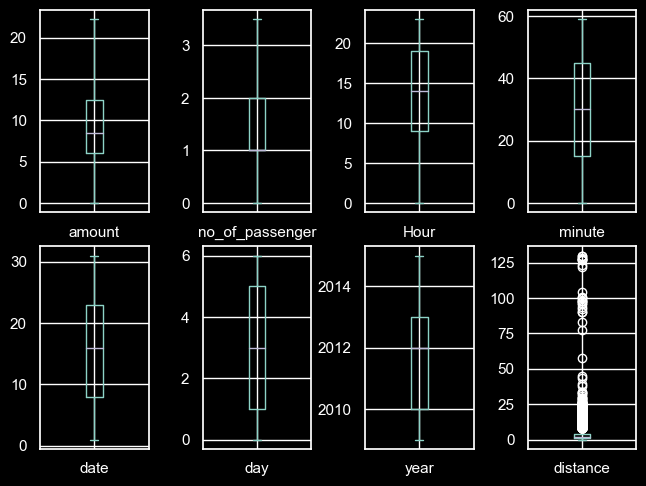

In [143]:
plt.subplot(241)
df['amount'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(242)
df['no_of_passenger'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(243)
df['Hour'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(244)
df['minute'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(245)
df['date'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(246)
df['day'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(247)
df['year'].plot.box()
plt.tight_layout(pad=0.5)

plt.subplot(248)
df['distance'].plot.box()
plt.tight_layout(pad=0.5)

plt.show()

<Axes: >

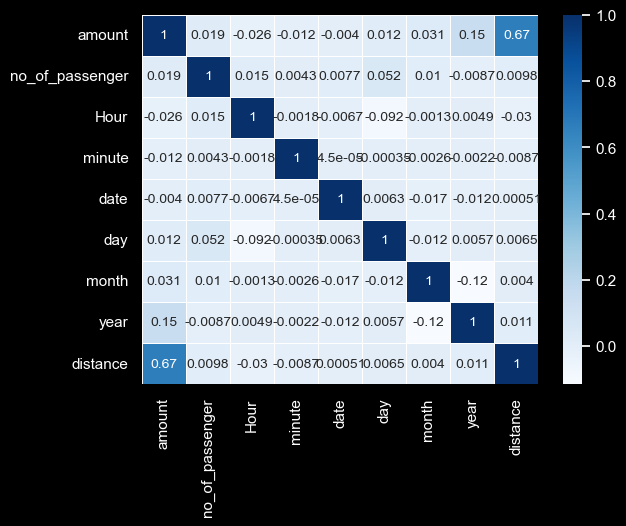

In [144]:
numeric_data = df.select_dtypes(include=['float64', 'int64'])
correlation_mat = numeric_data.corr()
sns.heatmap(correlation_mat, annot=True,linewidths=.5, cmap="Blues")

In [145]:
lowAge,uppAge=remove_outliers(df["distance"])
df["distance"]=np.where(df['distance']>uppAge,uppAge,df['distance'])
df["distance"]=np.where(df['distance']<lowAge,lowAge,df['distance'])

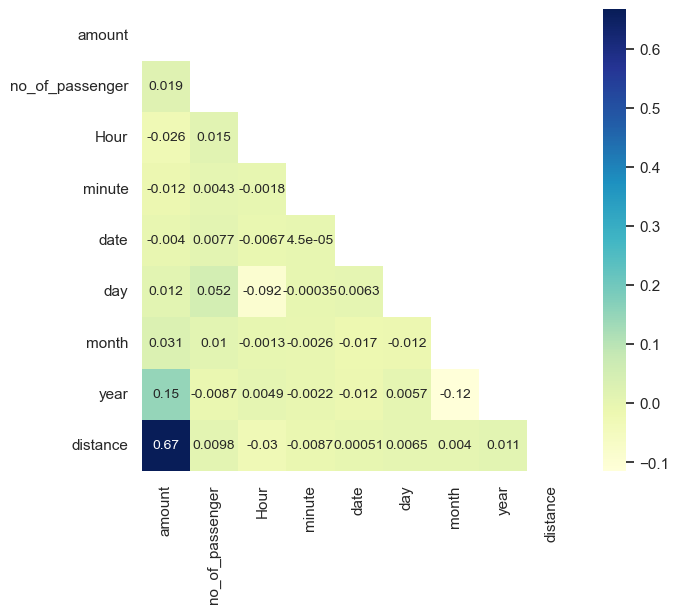

In [146]:
mask=np.zeros_like(correlation_mat)
mask[np.triu_indices_from(mask)]=True
with sns.axes_style("white"):
    f,ax = plt.subplots(figsize=(7,6))
    ax = sns.heatmap(correlation_mat, mask=mask,annot=True,cmap="YlGnBu")

In [147]:
# sns.pairplot(df.head(500),hue="amount")

In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48447 entries, 0 to 49998
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   amount           48447 non-null  float64
 1   no_of_passenger  48447 non-null  float64
 2   Hour             48447 non-null  int64  
 3   minute           48447 non-null  int64  
 4   date             48447 non-null  int64  
 5   day              48447 non-null  int64  
 6   month            48447 non-null  int64  
 7   year             48447 non-null  int64  
 8   distance         48447 non-null  float64
dtypes: float64(3), int64(6)
memory usage: 3.7 MB


<Axes: >

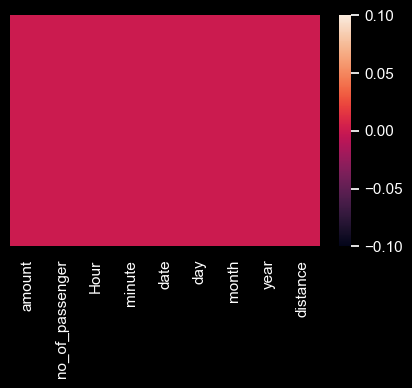

In [149]:
plt.figure(figsize=(5,3))
sns.heatmap(df.isnull(),yticklabels=False)

In [150]:
print("Data distribution analysis:->-------------------------\n")
print("\nMean:->\n")
print("amount: ",np.mean(df["amount"]))
print("no_of_passenger: ",np.mean(df["no_of_passenger"]))
print("Hour: ",np.mean(df["Hour"]))
print("minute: ",np.mean(df["minute"]))
print("date: ",np.mean(df["date"]))
print("day: ",np.mean(df["day"]))
print("year: ",np.mean(df["year"]))
print("distance: ",np.mean(df["distance"]))

print("\nMode:->\n")
print("amount: ",stats.mode(df["amount"])[0])
print("no_of_passenger: ",stats.mode(df["no_of_passenger"])[0])
print("Hour: ",stats.mode(df["Hour"])[0])
print("minute: ",stats.mode(df["minute"])[0])
print("date: ",stats.mode(df["date"])[0])
print("day: ",stats.mode(df["day"])[0])
print("year: ",stats.mode(df["year"])[0])
print("distance: ",stats.mode(df["distance"])[0])

print("\nMedian:->\n")
print("amount: ",np.median(df["amount"]))
print("no_of_passenger: ",np.median(df["no_of_passenger"]))
print("Hour: ",np.median(df["Hour"]))
print("minute: ",np.median(df["minute"]))
print("dadayte: ",np.median(df["date"]))
print("day: ",np.median(df["day"]))
print("year: ",np.median(df["year"]))
print("distance: ",np.median(df["distance"]))

print("\nStandard Deviation:->\n")
print("amount: ",np.std(df["amount"]))
print("no_of_passenger: ",np.std(df["no_of_passenger"]))
print("Hour: ",np.std(df["Hour"]))
print("minute: ",np.std(df["minute"]))
print("date: ",np.std(df["date"]))
print("day: ",np.std(df["day"]))
print("year: ",np.std(df["year"]))
print("distance: ",np.std(df["distance"]))

Data distribution analysis:->-------------------------


Mean:->

amount:  10.130407661981133
no_of_passenger:  1.5065741944805664
Hour:  13.48585051705988
minute:  29.652424298718188
date:  15.67131091708465
day:  3.031931801762751
year:  2011.7436373769274
distance:  2.9523548836270943

Mode:->

amount:  22.25
no_of_passenger:  1.0
Hour:  19
minute:  51
date:  16
day:  4
year:  2012
distance:  8.003335750053532

Median:->

amount:  8.5
no_of_passenger:  1.0
Hour:  14.0
minute:  30.0
dadayte:  16.0
day:  3.0
year:  2012.0
distance:  2.186905474931525

Standard Deviation:->

amount:  5.450796233080087
no_of_passenger:  0.868968778295747
Hour:  6.504413001749378
minute:  17.308501061225474
date:  8.659301751457662
day:  1.955907556605406
year:  1.8665289718452505
distance:  2.2254526381066455


In [151]:
fig = px.histogram(df["amount"],x="amount",y="amount")
fig.update_layout(title="amount")
fig.show()

fig = px.histogram(df["no_of_passenger"],x="no_of_passenger",y="no_of_passenger")
fig.update_layout(title="no_of_passenger")
fig.show()

fig = px.histogram(df["Hour"],x="Hour",y="Hour")
fig.update_layout(title="Hour")
fig.show()

fig = px.histogram(df["minute"],x="minute",y="minute")
fig.update_layout(title="minute")
fig.show()

fig = px.histogram(df["date"],x="date",y="date")
fig.update_layout(title="date")
fig.show()

fig = px.histogram(df["day"],x="day",y="day")
fig.update_layout(title="day")
fig.show()

fig = px.histogram(df["year"],x="year",y="year")
fig.update_layout(title="year")
fig.show()

fig = px.histogram(df["distance"],x="distance",y="distance")
fig.update_layout(title="distance")
fig.show()


### Machine Learning Model

#### -->> Regression Model

In [152]:
X=df.drop(["amount"],axis=1)
Y=df["amount"]

In [153]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.30,random_state=1)

#### 1. Linear Regression Model

In [154]:
model_lr=LinearRegression()


In [155]:
model_lr.fit(X_train,Y_train)

LinearRegression()

In [156]:
model_lr.score(X_train,Y_train)

0.7892643644286794

In [157]:
model_lr.score(X_test,Y_test)

0.7951149882757751

In [158]:
print("Training: {:6.2f}%".format(100*model_lr.score(X_train, Y_train)))
print("Test set: {:6.2f}%".format(100*model_lr.score(X_test, Y_test)))

Training:  78.93%
Test set:  79.51%


#### 2. Decision Tree Regression Model

In [159]:
model_dtr=DecisionTreeRegressor(max_depth=2)

In [160]:
model_dtr.fit(X_train,Y_train)

DecisionTreeRegressor(max_depth=2)

In [161]:
model_dtr.score(X_train,Y_train)

0.734685713407867

In [162]:
model_dtr.score(X_test,Y_test)

0.7338073951043647

In [163]:
print("Training: {:6.2f}%".format(100*model_dtr.score(X_train, Y_train)))
print("Test set: {:6.2f}%".format(100*model_dtr.score(X_test, Y_test)))

Training:  73.47%
Test set:  73.38%


#### 3. Bagging Regression Model

In [164]:
model_br=BaggingRegressor(base_estimator=model_dtr)

In [165]:
model_br.fit(X_train,Y_train)

BaggingRegressor(base_estimator=DecisionTreeRegressor(max_depth=2))

In [166]:
model_br.score(X_train,Y_train)

0.7382511538179607

In [167]:
model_br.score(X_test,Y_test)

0.7377834966009462

In [168]:
print("Training: {:6.2f}%".format(100*model_br.score(X_train, Y_train)))
print("Test set: {:6.2f}%".format(100*model_br.score(X_test, Y_test)))

Training:  73.83%
Test set:  73.78%


#### 4. Support Vector Regression Model

In [169]:
model_svr=SVR(C=4,degree= 4)

In [170]:
model_svr.fit(X_train,Y_train)

SVR(C=4, degree=4)

In [171]:
model_svr.score(X_train,Y_train)

-0.006476846093006916

In [172]:
model_svr.score(X_test,Y_test)

-0.0060823493287442965

#### 5. AdaBoost Regression Model

In [173]:
model_abr=AdaBoostRegressor(n_estimators=200,random_state=10,base_estimator=model_dtr)

In [174]:
model_abr.fit(X_train,Y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=2),
                  n_estimators=200, random_state=10)

In [175]:
model_abr.score(X_train,Y_train)

0.6747002689063532

In [176]:
model_abr.score(X_test,Y_test)

0.6767273576009756

In [177]:
print("Training: {:6.2f}%".format(100*model_abr.score(X_train, Y_train)))
print("Test set: {:6.2f}%".format(100*model_abr.score(X_test, Y_test)))

Training:  67.47%
Test set:  67.67%


#### 6. Gradient Boosting Regression model

In [178]:
model_gbr=GradientBoostingRegressor()

In [179]:
model_gbr.fit(X_train,Y_train)

GradientBoostingRegressor()

In [180]:
model_gbr.score(X_train,Y_train)

0.8265038245778316

In [181]:
model_gbr.score(X_test,Y_test)

0.8224958473867802

In [182]:
print("Training: {:6.2f}%".format(100*model_gbr.score(X_train, Y_train)))
print("Test set: {:6.2f}%".format(100*model_gbr.score(X_test, Y_test)))

Training:  82.65%
Test set:  82.25%


#### 7. Random Forest Regression Model

In [183]:
model_rfr=RandomForestRegressor(n_estimators=150,max_depth=2)

In [184]:
model_rfr.fit(X_train,Y_train)

RandomForestRegressor(max_depth=2, n_estimators=150)

In [185]:
model_rfr.score(X_train,Y_train)

0.7419752523430805

In [186]:
model_rfr.score(X_test,Y_test)

0.7418307273638629

In [187]:
print("Training: {:6.2f}%".format(100*model_rfr.score(X_train, Y_train)))
print("Test set: {:6.2f}%".format(100*model_rfr.score(X_test, Y_test)))

Training:  74.20%
Test set:  74.18%
